In [5]:
import os
import json
import pickle
from sklearn import metrics
import math
import random
import pandas as pd
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

In [2]:
font1 = {'family' : 'Arial',
'weight' : 'normal',
'size'   : 23,
}
import warnings
warnings.filterwarnings("ignore")

In [3]:
def is_intersect(node1, node2, node3, node4):
    lon1, lat1 = node1['lon'], node1['lat']
    lon2, lat2 = node2['lon'], node2['lat']
    lon3, lat3 = node3['lon'], node3['lat']
    lon4, lat4 = node4['lon'], node4['lat']
    distance1_3 = abs(lon1 - lon3) * 100000 + abs(lat1 - lat3) * 100000
    distance1_4 = abs(lon1 - lon4) * 100000 + abs(lat1 - lat4) * 100000
    distance2_3 = abs(lon2 - lon3) * 100000 + abs(lat2 - lat3) * 100000
    distance2_4 = abs(lon2 - lon4) * 100000 + abs(lat2 - lat4) * 100000
    min_distance = np.min([distance1_3, distance1_4, distance2_3, distance2_4])
    if min_distance == 0:
        return False
    else:
        if np.max([lon1, lon2]) < np.min([lon3, lon4]) or np.max([lon3, lon4]) < np.min([lon1, lon2]):
            return False
        else:
            sort_points = np.sort([lon1, lon2, lon3, lon4])
            left_point, right_point = sort_points[1], sort_points[2]
            if lon1 == lon2:
                value_point1 = [lat1, lat2]
            else:
                value_point1 = [(lat2-lat1)/(lon2-lon1)*(left_point-lon1)+lat1, (lat2-lat1)/(lon2-lon1)*(right_point-lon1)+lat1]
            if lon3 == lon4:
                value_point2 = [lat3, lat4]
            else:
                value_point2 = [(lat4 - lat3) / (lon4 - lon3) * (left_point - lon3) + lat3,
                               (lat4 - lat3) / (lon4 - lon3) * (right_point - lon3) + lat3]
            if np.max(value_point1) < np.min(value_point2) or np.max(value_point2) < np.min(value_point1):
                return False
            else:
                return True


def is_acute(node1, node2, node3, node4):
    lon1, lat1 = node1['lon'], node1['lat']
    lon2, lat2 = node2['lon'], node2['lat']
    lon3, lat3 = node3['lon'], node3['lat']
    lon4, lat4 = node4['lon'], node4['lat']
    distance1_3 = abs(lon1-lon3)*100000 + abs(lat1-lat3)*100000
    distance1_4 = abs(lon1-lon4)*100000 + abs(lat1-lat4)*100000
    distance2_3 = abs(lon2-lon3)*100000 + abs(lat2-lat3)*100000
    distance2_4 = abs(lon2-lon4)*100000 + abs(lat2-lat4)*100000
    min_distance = np.min([distance1_3, distance1_4, distance2_3, distance2_4])
    if min_distance > 0:
        return False
    else:
        if distance1_3 == min_distance:
            x1,y1 = lon2-lon1, lat2-lat1
            x2,y2 = lon4-lon3, lat4-lat3
        if distance1_4 == min_distance:
            x1,y1 = lon2-lon1, lat2-lat1
            x2,y2 = lon3-lon4, lat3-lat4
        if distance2_3 == min_distance:
            x1,y1 = lon1-lon2, lat1-lat2
            x2,y2 = lon4-lon3, lat4-lat3
        if distance2_4 == min_distance:
            x1,y1 = lon1-lon2, lat1-lat2
            x2,y2 = lon3-lon4, lat3-lat4

        vector_1 = [x1, y1]
        vector_2 = [x2, y2]
        unit_vector_1 = vector_1 / np.linalg.norm(vector_1)
        unit_vector_2 = vector_2 / np.linalg.norm(vector_2)
        dot_product = np.dot(unit_vector_1, unit_vector_2)
        angle = np.arccos(dot_product) / math.pi * 180
        if angle < 40:
            return True
        else:
            return False


def is_valid(new_edge, existed_edges, id2node):
    for edge in existed_edges:
        if is_intersect(
                id2node[new_edge['start']], id2node[new_edge['end']],
                id2node[edge['start']], id2node[edge['end']]
        ) or is_acute(
            id2node[new_edge['start']], id2node[new_edge['end']],
            id2node[edge['start']], id2node[edge['end']]
        ):
            return False
    return True

import os
import re
import json
import numpy as np
import networkx as nx


class DataLoader():
    def __init__(self, data_dir):
        self.data_dir = data_dir
        self.data = {}
        self.ids = []
        self.cities = set()
        self.samples = {}
        self.load_cities()

    def load_cities(self):
        files = os.listdir(self.data_dir)
        for file in files:
            name = file[:-5]
            number = re.findall('[0-9]+', name)[0]
            city, attr = name.split(number)
            if city not in self.cities:
                self.cities.add(city)
            if city not in self.samples:
                self.samples[city] = set()
            self.samples[city].add(number)
        self.cities = list(self.cities)
        for city in self.samples:
            self.samples[city] = list(self.samples[city])

    def load_all_datas(self):
        for city in self.cities:
            self.load_dir_datas(city)

    def initialize(self):
        self.data = {}
        self.ids = []

    def load_one_sample(self, sample):
        name = sample[:-5]
        number = re.findall('[0-9]+', name)[0]
        city, attr = name.split(number)
        id1 = city + '_' + number + '_1'
        id2 = city + '_' + number + '_2'
        if city not in self.data:
            self.data[city] = {}
        if id1 not in self.data[city]:
            self.data[city][id1] = {'id': id1, 'nodes': [], 'source_edges': [], 'target_edges': []}
            self.data[city][id2] = {'id': id2, 'nodes': [], 'source_edges': [], 'target_edges': []}
            self.ids += [id1, id2]
        data = json.load(open(self.data_dir + sample, 'r'))
        if attr == 'nodes':
            self.data[city][id1]['nodes'] = data
            self.data[city][id2]['nodes'] = data
        else:
            for edge in data:
                if edge['inSample1'] == 1:
                    self.data[city][id1]['source_edges'].append({
                        'start': edge['start'],
                        'end': edge['end'],
                    })
                if edge['inSample1'] == 0:
                    self.data[city][id1]['target_edges'].append({
                        'start': edge['start'],
                        'end': edge['end'],
                    })
                if edge['inSample2'] == 1:
                    self.data[city][id2]['source_edges'].append({
                        'start': edge['start'],
                        'end': edge['end'],
                    })
                if edge['inSample2'] == 0:
                    self.data[city][id2]['target_edges'].append({
                        'start': edge['start'],
                        'end': edge['end'],
                    })

    def load_dir_datas(self, cityname):
        files = os.listdir(self.data_dir)
        for file in files:
            name = file[:-5]
            number = re.findall('[0-9]+', name)[0]
            city, attr = name.split(number)
            if city != cityname:
                continue
            id1 = city + '_' + number + '_1'
            id2 = city + '_' + number + '_2'
            if city not in self.data:
                self.data[city] = {}
            if id1 not in self.data[city]:
                self.data[city][id1] = {'id': id1, 'nodes': [], 'source_edges': [], 'target_edges': []}
                self.data[city][id2] = {'id': id2, 'nodes': [], 'source_edges': [], 'target_edges': []}
                self.ids += [id1, id2]

            data = json.load(open(self.data_dir + file, 'r'))
            if attr == 'nodes':
                self.data[city][id1]['nodes'] = data
                self.data[city][id2]['nodes'] = data
            else:
                for edge in data:
                    if edge['inSample1'] == 1:
                        self.data[city][id1]['source_edges'].append({
                            'start': edge['start'],
                            'end': edge['end'],
                        })
                    if edge['inSample1'] == 0:
                        self.data[city][id1]['target_edges'].append({
                            'start': edge['start'],
                            'end': edge['end'],
                        })
                    if edge['inSample2'] == 1:
                        self.data[city][id2]['source_edges'].append({
                            'start': edge['start'],
                            'end': edge['end'],
                        })
                    if edge['inSample2'] == 0:
                        self.data[city][id2]['target_edges'].append({
                            'start': edge['start'],
                            'end': edge['end'],
                        })

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, index):
        if type(index) == int:
            index = self.ids[index]
        city, number, idx = index.split('_')
        return self.data[city][index]

    @staticmethod
    def build_graph(nodes, edges):
        ids = [str(n['osmid']) for n in nodes]
        edges = [(str(e['start']), str(e['end'])) for e in edges] + [(str(e['end']), str(e['start'])) for e in edges]
        graph = nx.DiGraph(np.array([[0] * len(nodes)] * len(nodes)))

        mapping = {i: ids[i] for i in range(len(ids))}
        graph = nx.relabel_nodes(graph, mapping)
        graph.add_edges_from(edges)
        return graph

    def build_source_graph(self, index):
        data = self[index]
        return DataLoader.build_graph(data['nodes'], data['source_edges'])

    def build_full_graph(self, index):
        data = self[index]
        return DataLoader.build_graph(data['nodes'], data['source_edges'] + data['target_edges'])

In [18]:
import copy
def load_city_result(city, model, data_dir):
    return pickle.load(open(data_dir + model + '/result/' + city + '_result.pkl', 'rb'))

def load_model_result(model, data_dir, data_type=None):
    if model == 'improved r-gcn':
        model = 'relational-gcn'
    files = os.listdir(data_dir + model + '/result/')
    result = {}
    for file in files:
        city = file.split('_')[0].strip()
        if data_type == 'America':
            if city not in ['New york', 'Los angeles', 'Chicago', 'Houston', 'Philadelphia',
                            'Phoenix', 'San diego', 'San antonio', 'Dallas', 'Detroit']:
                continue
        if data_type == 'Asia':
            if city not in ['Tokyo', 'Osaka', 'Beijing', 'Shanghai', 'Guangzhou',
                            'Shenzhen', 'Hongkong', 'Singapore', 'Seoul', 'Delhi']:
                continue
        if data_type == 'Europe':
            if city not in ['London', 'Paris', 'Moscow', 'Amsterdam', 'Milan', 'Madrid',
                           'Brussels', 'Berlin', 'Munich', 'Stockholm']:
                continue
        result[city] = load_city_result(city, model, data_dir)
    return result

def roc_curve(model, data_dir, data_type = None, improved = False):
    def metrics(Y):
        positive = sum([y['target'] for y in Y])
        negative = len(Y) - positive
        thresholds = np.linspace(1, 1e-9, 1000)
        fpr, tpr = [], []
        index = 0
        right, wrong = 0, 0
        existed_edges = {ids: test[ids]['source_edges'] for ids in test.ids}
        id2node = {node['osmid']: node for ids in test.ids for node in test[ids]['nodes']}
        for _, th in enumerate(thresholds):
            if _ % 10 == 0:
                print(_, end=',')
            if _ == 950:
                break
            for i in range(index, len(Y)):
                if Y[i]['score'] < math.log(th):
                    index = i
                    break
                if improved:
                    if is_valid({'start': Y[i]['start'], 'end': Y[i]['end']}, existed_edges[Y[i]['id']], id2node):
                        existed_edges[Y[i]['id']].append({'start': Y[i]['start'], 'end': Y[i]['end']})
                        if Y[i]['target'] == 1:
                            right += 1
                        else:
                            wrong += 1
                else:
                    if Y[i]['target'] == 1:
                        right += 1
                    else:
                        wrong += 1
            fpr.append(wrong / negative)
            tpr.append(right / positive)
        print()
        ft_sort = [[f, t] for f, t in zip(fpr, tpr)]
        ft_sort.sort(key=lambda e: e[0])
        fpr, tpr = [r[0] for r in ft_sort], [r[1] for r in ft_sort]
        return fpr, tpr
        
    test = DataLoader('D:/data/road-network-predictability/data_2020715/test/')
    test.load_all_datas()
    result = load_model_result(model, data_dir, data_type)
    y = []
    for city in result:
        for index, v in result[city].items():
            for sample in v:
                if improved:
                    y.append({
                        'id': index,
                        'start': sample['start'],
                        'end': sample['end'],
                        'score': sample['score'],
                        'target': int(sample['target'])
                    })
                else:
                    y.append({
                        'score': sample['score'],
                        'target': int(sample['target'])
                    })
                
    del result
    y = sorted(y, key=lambda e: e['score'], reverse=True)
    return metrics(y)


def precision_recall(model, data_dir, data_type = None, improved = False):
    def metrics(Y):
        positive = sum([y['target'] for y in Y])

        thresholds = np.linspace(1, 1e-9, 1000)
        precision, recall = [], []
        index = 0
        right, wrong = 0, 0
        existed_edges = {ids: test[ids]['source_edges'] for ids in test.ids}
        id2node = {node['osmid']: node for ids in test.ids for node in test[ids]['nodes']}
        best_p, best_r = None, None
        for _, th in enumerate(thresholds):
            if _ % 10 == 0 and improved:
                print(_, end=',')
            if _ == 950:
                break
            for i in range(index, len(Y)):
                if Y[i]['score'] < math.log(th):
                    index = i
                    break
                if improved:
                    if is_valid({'start': Y[i]['start'], 'end': Y[i]['end']}, existed_edges[Y[i]['id']], id2node):
                        existed_edges[Y[i]['id']].append({'start': Y[i]['start'], 'end': Y[i]['end']})
                        if Y[i]['target'] == 1:
                            right += 1
                        else:
                            wrong += 1
                else:
                    if Y[i]['target'] == 1:
                        right += 1
                    else:
                        wrong += 1
            p = 1.0 * right / (right + wrong + 1e-9)
            r = 1.0 * right / positive
            precision.append(p)
            recall.append(r)
            if improved and abs(th - 0.6) < 1e-3:
                best_p, best_r = p, r
        if improved:
            print()
        pr_sort = {r: p for p, r in zip(precision, recall)}
        #pr_sort[1.] = 0.
        keys = copy.deepcopy(list(pr_sort.keys()))
        for k in keys:
            if k < 0.01:
                pr_sort.pop(k)
        pr_sort = [[p, r] for r, p in pr_sort.items()]
        pr_sort.sort(key=lambda e: e[1])
        precision, recall = [r[0] for r in pr_sort], [r[1] for r in pr_sort]
        auc = sum([(pr_sort[i][0]+pr_sort[i-1][0])*(pr_sort[i][1]-pr_sort[i-1][1])/2 for i in range(1, len(pr_sort))])
        return precision, recall, auc, best_p, best_r
    
    test = DataLoader('D:/data/road-network-predictability/data_2020715/test/')
    test.load_all_datas()
    result = load_model_result(model.lower(), data_dir, data_type)
    y = []
    for city in result:
        for index, v in result[city].items():
            for sample in v:
                if improved:
                    y.append({
                        'id': index,
                        'start': sample['start'],
                        'end': sample['end'],
                        'score': sample['score'],
                        'target': int(sample['target'])
                    })
                else:
                    y.append({
                        'score': sample['score'],
                        'target': int(sample['target'])
                    })
    del result
    y = sorted(y, key=lambda e: e['score'], reverse=True)
    p, r, a, b_p, b_r =  metrics(y)
    if improved:
        data = {'precision': p, 'recall': r, 'auc': a, 'best_p': b_p, 'best_r': b_r}
        city = data_type.lower() if data_type is not None else 'total'
        json.dump(data, open('precision_recall_' + city + '.json', 'w'), indent = 2)
    return p, r, a, b_p, b_r

# Total

Node2Vec
Struc2Vec
Graph-SAGE
Spectral-GCN
Relational-GCN
GAT


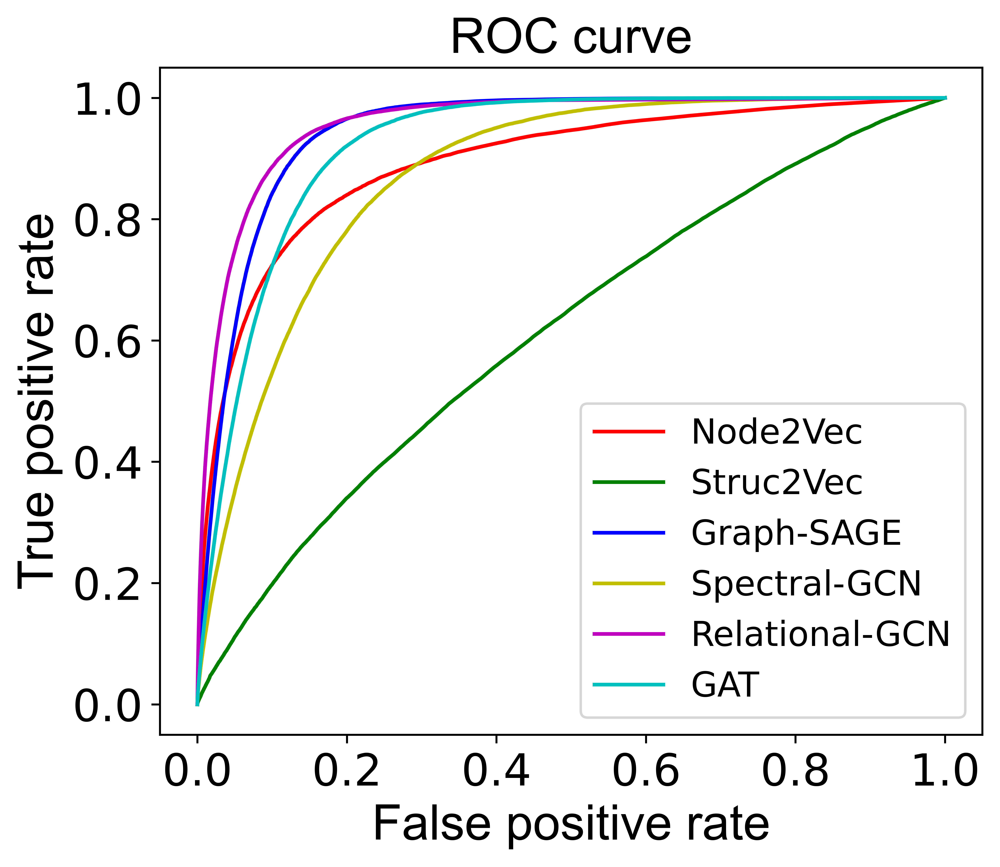

In [4]:
data_dir = 'D:/data/road-network-predictability/data_2020715/'
models = ['Node2Vec', 'Struc2Vec', 'Graph-SAGE', 'Spectral-GCN', 'Relational-GCN', 'GAT']
colors = ['r', 'g', 'b', 'y', 'm', 'c']
fig = plt.figure(figsize=(6,5),dpi=1200)
for i, model in enumerate(models):
    print(model)
    fpr, tpr = roc_curve(model, data_dir)
    plt.plot(fpr, tpr, color=colors[i], label=model)
plt.title("ROC curve",font1, fontsize=20)
plt.xlabel('False positive rate',font1, fontsize=20)
plt.ylabel('True positive rate',font1, fontsize=20)
plt.xticks([0,0.2, 0.4, 0.6, 0.8, 1.0],fontsize=18)
plt.yticks([0,0.2, 0.4, 0.6, 0.8, 1.0],fontsize=18)
plt.legend(loc="lower right",fontsize=14)
plt.savefig('figure1_b_total.pdf',bbox_inches = 'tight')
plt.savefig('figure1_b_total.svg',bbox_inches = 'tight')
plt.show()

Relational-GCN
0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200,210,220,230,240,250,260,270,280,290,300,310,320,330,340,350,360,370,380,390,400,410,420,430,440,450,460,470,480,490,500,510,520,530,540,550,560,570,580,590,600,610,620,630,640,650,660,670,680,690,700,710,720,730,740,750,760,770,780,790,800,810,820,830,840,850,860,870,880,890,900,910,920,930,940,950,


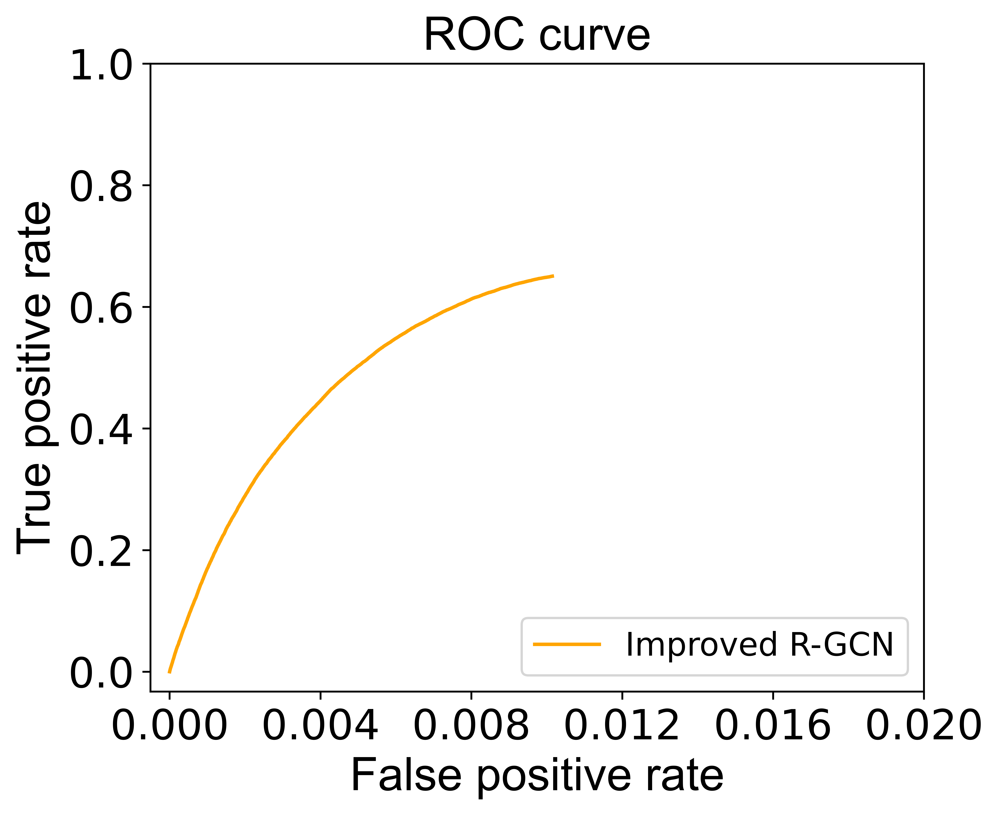

In [5]:
data_dir = 'D:/data/road-network-predictability/data_2020715/'
models = ['Relational-GCN']
colors = ['orange']
fig = plt.figure(figsize=(6,5),dpi=1200)
for i, model in enumerate(models):
    print(model)
    fpr, tpr = roc_curve(model, data_dir, improved = True)
    plt.plot(fpr, tpr, color=colors[i], label='Improved R-GCN')
plt.title("ROC curve",font1, fontsize=20)
plt.xlabel('False positive rate',font1, fontsize=20)
plt.ylabel('True positive rate',font1, fontsize=20)
plt.xticks([0,0.004,0.008,0.012,0.016,0.02],fontsize=18)
plt.yticks([0,0.2, 0.4, 0.6, 0.8, 1.0],fontsize=18)
plt.legend(loc="lower right",fontsize=14)
plt.savefig('figure1_b_improved_total.pdf',bbox_inches = 'tight')
plt.savefig('figure1_b_improved_total.svg',bbox_inches = 'tight')
plt.show()

Node2Vec
Struc2Vec
Graph-SAGE
Spectral-GCN
Relational-GCN
GAT
Improved R-GCN
0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200,210,220,230,240,250,260,270,280,290,300,310,320,330,340,350,360,370,380,390,400,410,420,430,440,450,460,470,480,490,500,510,520,530,540,550,560,570,580,590,600,610,620,630,640,650,660,670,680,690,700,710,720,730,740,750,760,770,780,790,800,810,820,830,840,850,860,870,880,890,900,910,920,930,940,950,


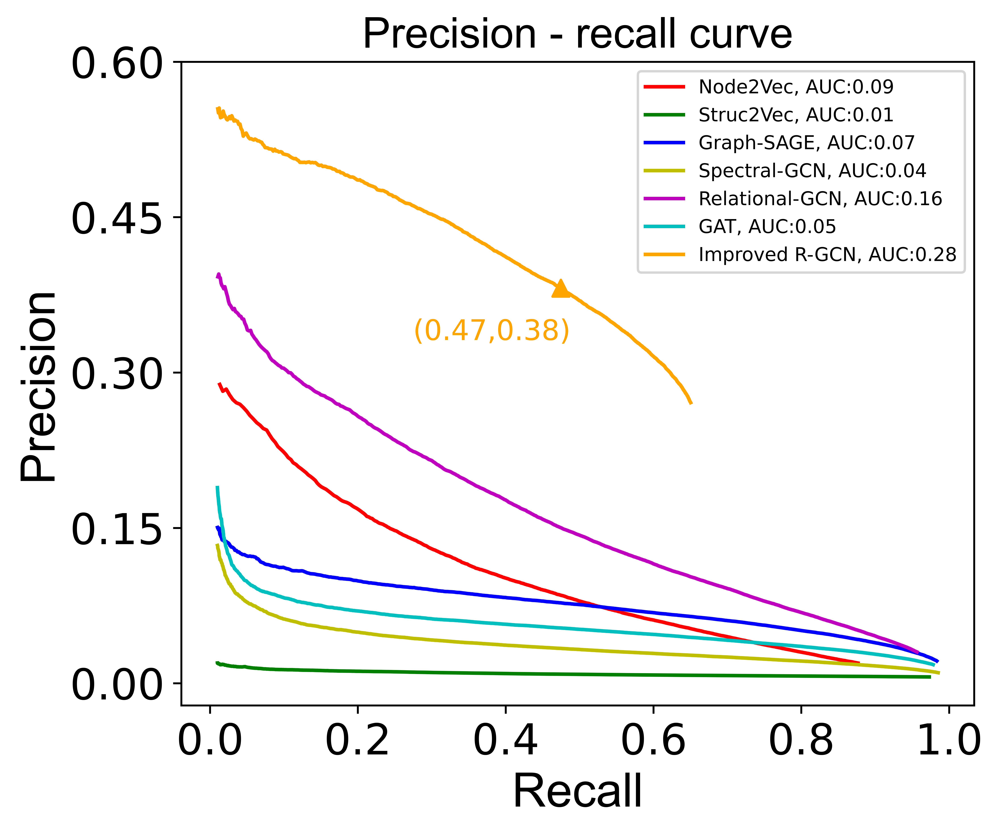

In [30]:
data_dir = 'D:/data/road-network-predictability/data_2020715/'
models = ['Node2Vec', 'Struc2Vec', 'Graph-SAGE', 'Spectral-GCN', 'Relational-GCN', 'GAT', 'Improved R-GCN']
colors = ['r', 'g', 'b', 'y', 'm', 'c', 'orange']
fig = plt.figure(figsize=(6,5), dpi=1200)
for i, model in enumerate(models):
    print(model)
    if i > 6:
        d = json.load(open('precision_recall_total.json', 'r'))
        precision, recall, auc, best_p, best_r = d['precision'], d['recall'], d['auc'], d['best_p'], d['best_r']
        print(best_p, best_r)
    else:
        precision, recall, auc, best_p, best_r = precision_recall(model, data_dir, data_type = None, improved = (i == 6))
    plt.plot(recall, precision, color=colors[i], label=model + ', AUC:' + str(round(auc, 2)))
    if best_p is not None:
        plt.scatter(best_r, best_p, color=colors[i], marker='^', s = 50)
        plt.text(best_r-0.2, best_p-0.05, "({},{})".format(round(best_r, 2), round(best_p, 2)), color=colors[i], size=12)
plt.title("Precision - recall curve", font1, fontsize=18)
plt.xlabel('Recall', font1, fontsize=20)
plt.ylabel('Precision', font1, fontsize=20)
plt.xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=18)
plt.yticks([0, 0.15, 0.3, 0.45, 0.6], fontsize=18)
plt.legend(loc="upper right",fontsize=8)
plt.savefig('figure1_c_total.pdf', bbox_inches = 'tight')
plt.savefig('figure1_c_total.svg', bbox_inches = 'tight')
plt.show()

# American

Node2Vec
Struc2Vec
Graph-SAGE
Spectral-GCN
Relational-GCN
GAT


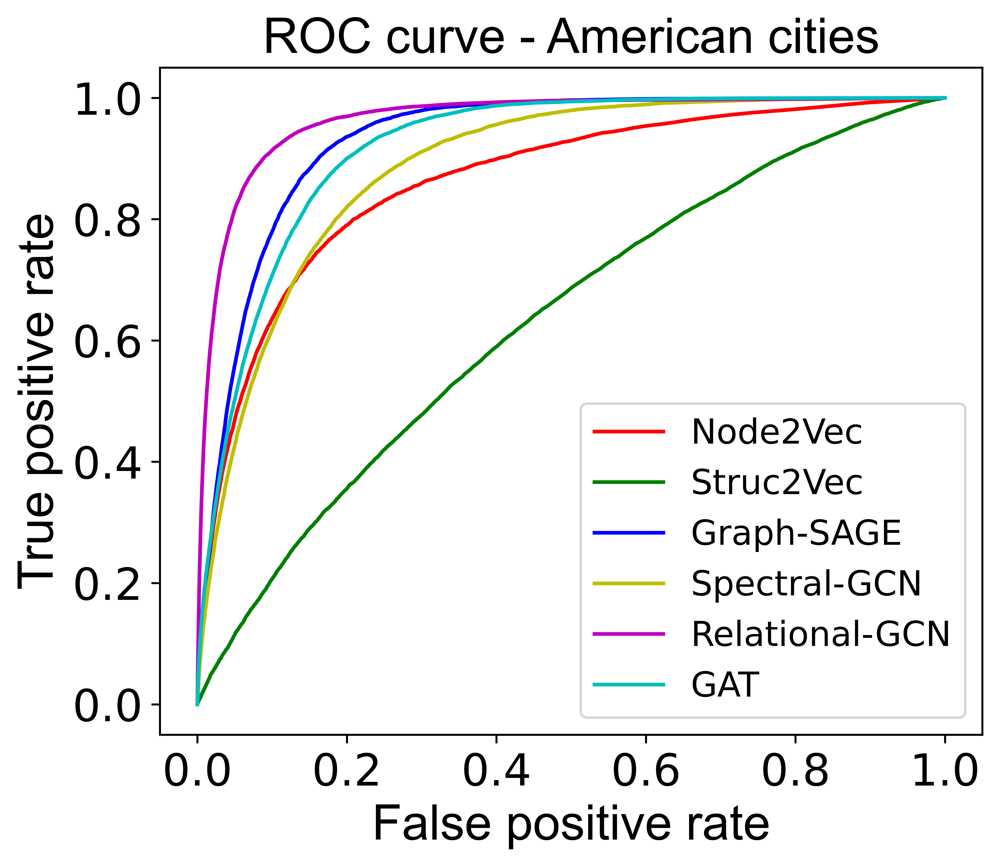

In [6]:
data_dir = 'D:/data/road-network-predictability/data_2020715/'
models = ['Node2Vec', 'Struc2Vec', 'Graph-SAGE', 'Spectral-GCN', 'Relational-GCN', 'GAT']
colors = ['r', 'g', 'b', 'y', 'm', 'c']
fig = plt.figure(figsize=(6,5),dpi=1200)
for i, model in enumerate(models):
    print(model)
    fpr, tpr = roc_curve(model, data_dir, data_type = 'America')
    plt.plot(fpr, tpr, color=colors[i], label=model)
plt.title("ROC curve - American cities",font1, fontsize=20)
plt.xlabel('False positive rate',font1, fontsize=20)
plt.ylabel('True positive rate',font1, fontsize=20)
plt.xticks([0,0.2, 0.4, 0.6, 0.8, 1.0],fontsize=18)
plt.yticks([0,0.2, 0.4, 0.6, 0.8, 1.0],fontsize=18)
plt.legend(loc="lower right",fontsize=14)
plt.savefig('figure1_b_america.pdf',bbox_inches = 'tight')
plt.savefig('figure1_b_america.svg',bbox_inches = 'tight')
plt.show()

Relational-GCN
0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200,210,220,230,240,250,260,270,280,290,300,310,320,330,340,350,360,370,380,390,400,410,420,430,440,450,460,470,480,490,500,510,520,530,540,550,560,570,580,590,600,610,620,630,640,650,660,670,680,690,700,710,720,730,740,750,760,770,780,790,800,810,820,830,840,850,860,870,880,890,900,910,920,930,940,950,


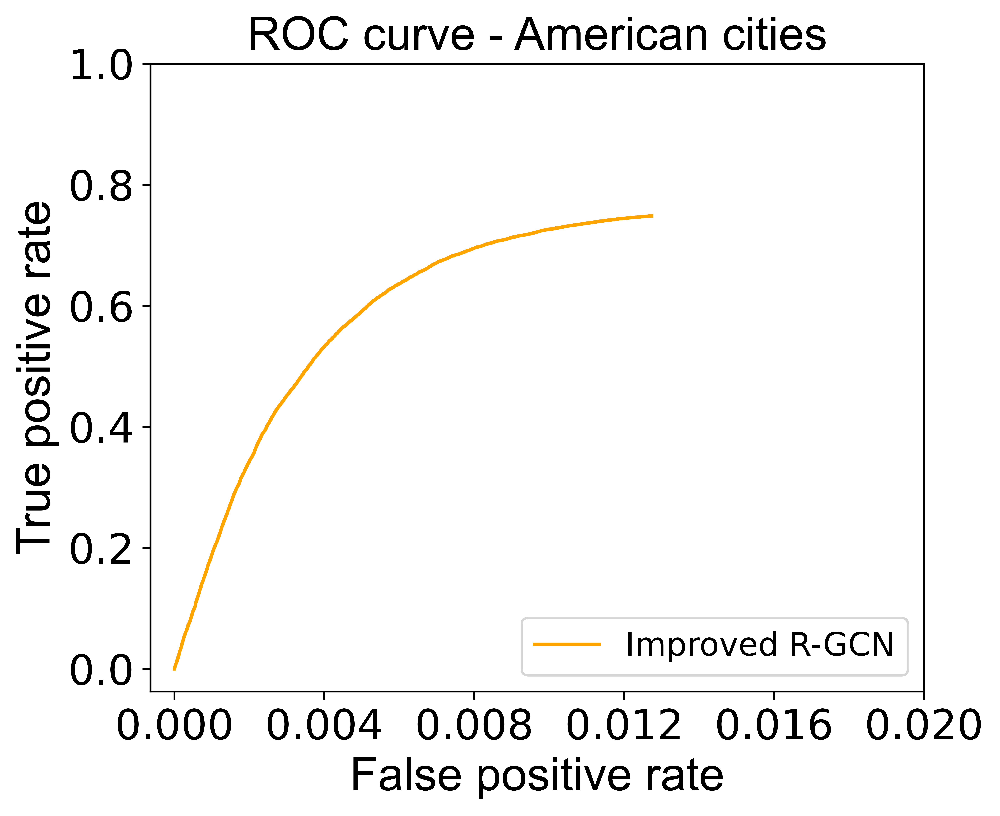

In [14]:
data_dir = 'D:/data/road-network-predictability/data_2020715/'
models = ['Relational-GCN']
colors = ['orange']
fig = plt.figure(figsize=(6,5),dpi=1200)
for i, model in enumerate(models):
    print(model)
    fpr, tpr = roc_curve(model, data_dir, data_type = 'America', improved = True)
    plt.plot(fpr, tpr, color=colors[i], label='Improved R-GCN')
plt.title("ROC curve - American cities",font1, fontsize=20)
plt.xlabel('False positive rate',font1, fontsize=20)
plt.ylabel('True positive rate',font1, fontsize=20)
plt.xticks([0,0.004,0.008,0.012,0.016,0.02],fontsize=18)
plt.yticks([0,0.2, 0.4, 0.6, 0.8, 1.0],fontsize=18)
plt.legend(loc="lower right",fontsize=14)
plt.savefig('figure1_b_improved_america.pdf',bbox_inches = 'tight')
plt.savefig('figure1_b_improved_america.svg',bbox_inches = 'tight')
plt.show()

Node2Vec
Struc2Vec
Graph-SAGE
Spectral-GCN
Relational-GCN
GAT
Improved R-GCN
0.5362824375032749 0.5414621131270011


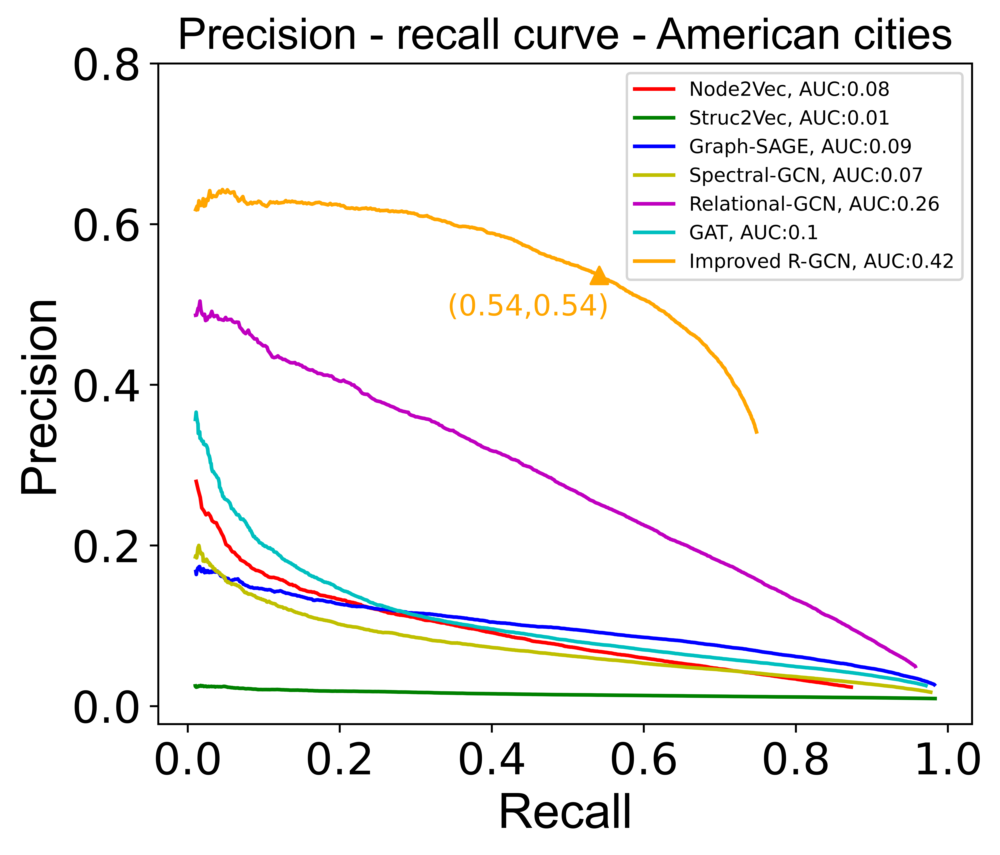

In [25]:
data_dir = 'D:/data/road-network-predictability/data_2020715/'
models = ['Node2Vec', 'Struc2Vec', 'Graph-SAGE', 'Spectral-GCN', 'Relational-GCN', 'GAT', 'Improved R-GCN']
colors = ['r', 'g', 'b', 'y', 'm', 'c', 'orange']
fig = plt.figure(figsize=(6,5),dpi=1200)
for i, model in enumerate(models):
    print(model)
    if i == 6:
        d = json.load(open('precision_recall_america.json', 'r'))
        precision, recall, auc, best_p, best_r = d['precision'], d['recall'], d['auc'], d['best_p'], d['best_r']
        print(best_p, best_r)
    else:
        precision, recall, auc, best_p, best_r = precision_recall(model, data_dir, data_type = 'America', improved = (i == 6))
    plt.plot(recall, precision, color=colors[i], label=model + ', AUC:' + str(round(auc, 2)))
    if best_p is not None:
        plt.scatter(best_r, best_p, color=colors[i], marker='^', s = 50)
        plt.text(best_r-0.2, best_p-0.05, "({},{})".format(round(best_r, 2), round(best_p, 2)), color=colors[i], size=12)
plt.title("Precision - recall curve - American cities",font1, fontsize=18)
plt.xlabel('Recall',font1, fontsize=20)
plt.ylabel('Precision',font1, fontsize=20)
plt.xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0],fontsize=18)
plt.yticks([0, 0.2, 0.4, 0.6, 0.8],fontsize=18)
plt.legend(loc="upper right",fontsize=8)
plt.savefig('figure1_c_america.pdf',bbox_inches = 'tight')
plt.savefig('figure1_c_america.svg',bbox_inches = 'tight')
plt.show()

# Asia

Node2Vec
Struc2Vec
Graph-SAGE
Spectral-GCN
Relational-GCN
GAT


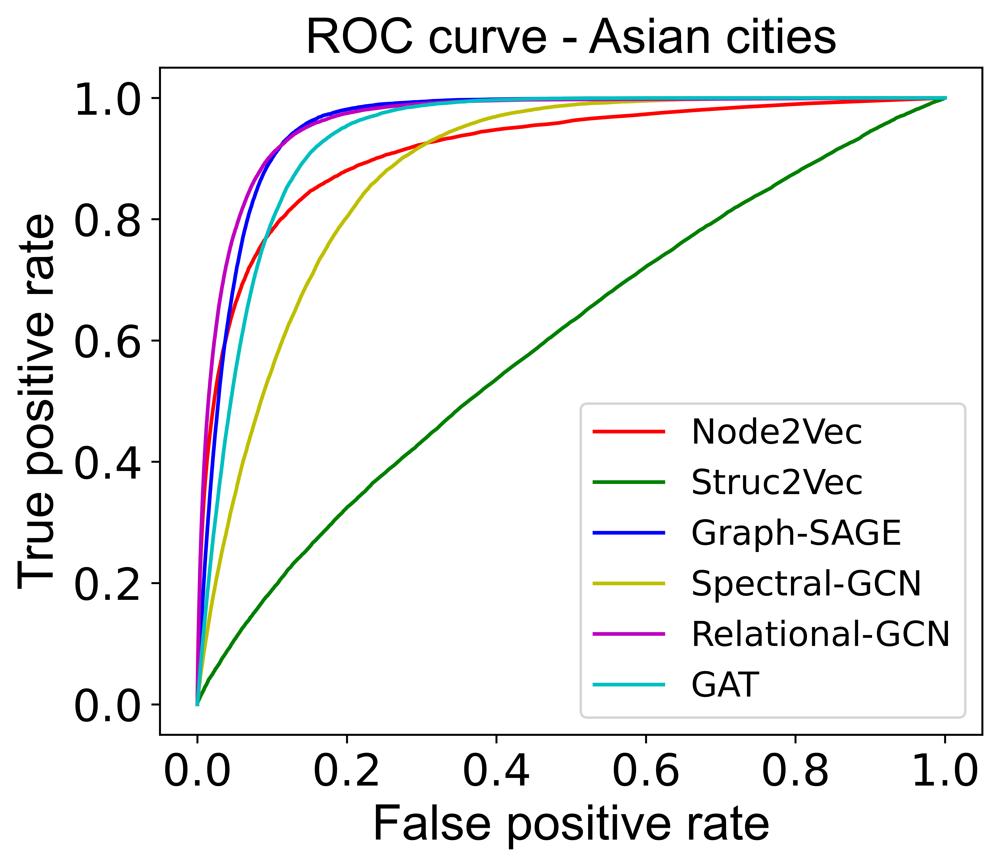

In [7]:
data_dir = 'D:/data/road-network-predictability/data_2020715/'
models = ['Node2Vec', 'Struc2Vec', 'Graph-SAGE', 'Spectral-GCN', 'Relational-GCN', 'GAT']
colors = ['r', 'g', 'b', 'y', 'm', 'c']
fig = plt.figure(figsize=(6,5),dpi=1200)
for i, model in enumerate(models):
    print(model)
    fpr, tpr = roc_curve(model, data_dir, data_type = 'Asia')
    plt.plot(fpr, tpr, color=colors[i], label=model)
plt.title("ROC curve - Asian cities",font1, fontsize=20)
plt.xlabel('False positive rate',font1, fontsize=20)
plt.ylabel('True positive rate',font1, fontsize=20)
plt.xticks([0,0.2, 0.4, 0.6, 0.8, 1.0],fontsize=18)
plt.yticks([0,0.2, 0.4, 0.6, 0.8, 1.0],fontsize=18)
plt.legend(loc="lower right",fontsize=14)
plt.savefig('figure1_b_asia.pdf',bbox_inches = 'tight')
plt.savefig('figure1_b_asia.svg',bbox_inches = 'tight')
plt.show()

Relational-GCN
0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200,210,220,230,240,250,260,270,280,290,300,310,320,330,340,350,360,370,380,390,400,410,420,430,440,450,460,470,480,490,500,510,520,530,540,550,560,570,580,590,600,610,620,630,640,650,660,670,680,690,700,710,720,730,740,750,760,770,780,790,800,810,820,830,840,850,860,870,880,890,900,910,920,930,940,950,


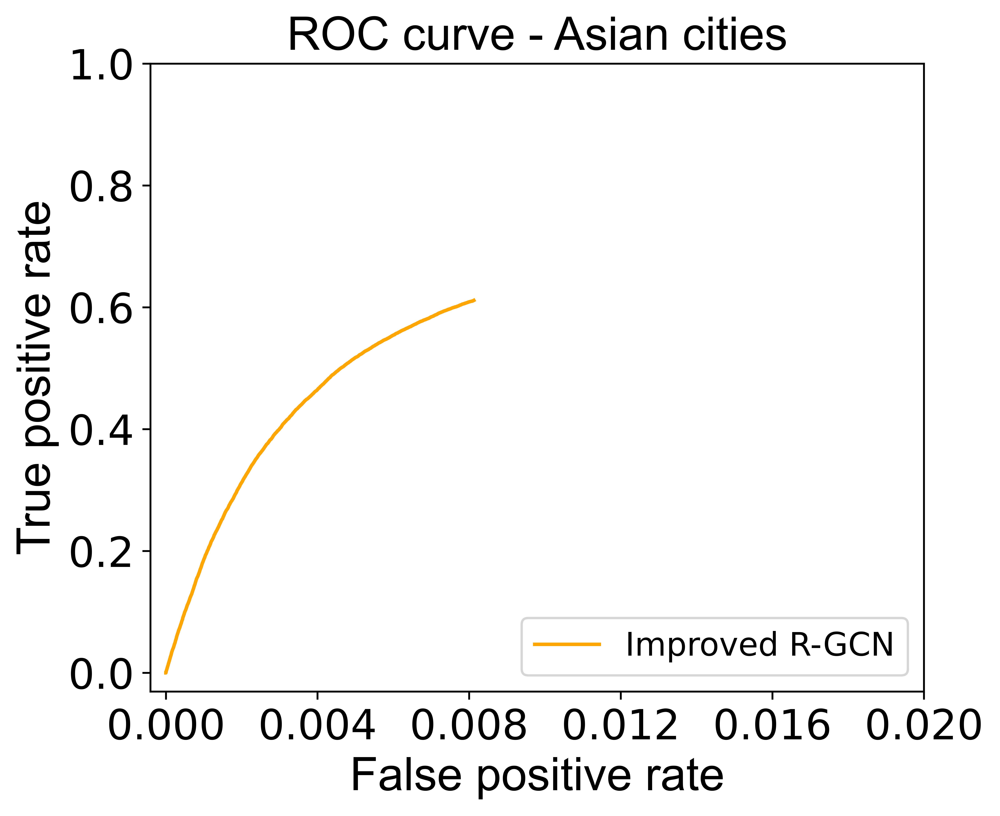

In [15]:
data_dir = 'D:/data/road-network-predictability/data_2020715/'
models = ['Relational-GCN']
colors = ['orange']
fig = plt.figure(figsize=(6,5),dpi=1200)
for i, model in enumerate(models):
    print(model)
    fpr, tpr = roc_curve(model, data_dir, data_type = 'Asia', improved = True)
    plt.plot(fpr, tpr, color=colors[i], label='Improved R-GCN')
plt.title("ROC curve - Asian cities",font1, fontsize=20)
plt.xlabel('False positive rate',font1, fontsize=20)
plt.ylabel('True positive rate',font1, fontsize=20)
plt.xticks([0,0.004,0.008,0.012,0.016,0.02],fontsize=18)
plt.yticks([0,0.2, 0.4, 0.6, 0.8, 1.0],fontsize=18)
plt.legend(loc="lower right",fontsize=14)
plt.savefig('figure1_b_improved_asia.pdf',bbox_inches = 'tight')
plt.savefig('figure1_b_improved_asia.svg',bbox_inches = 'tight')
plt.show()

Node2Vec
Struc2Vec
Graph-SAGE
Spectral-GCN
Relational-GCN
GAT
Improved R-GCN
0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200,210,220,230,240,250,260,270,280,290,300,310,320,330,340,350,360,370,380,390,400,410,420,430,440,450,460,470,480,490,500,510,520,530,540,550,560,570,580,590,600,610,620,630,640,650,660,670,680,690,700,710,720,730,740,750,760,770,780,790,800,810,820,830,840,850,860,870,880,890,900,910,920,930,940,950,


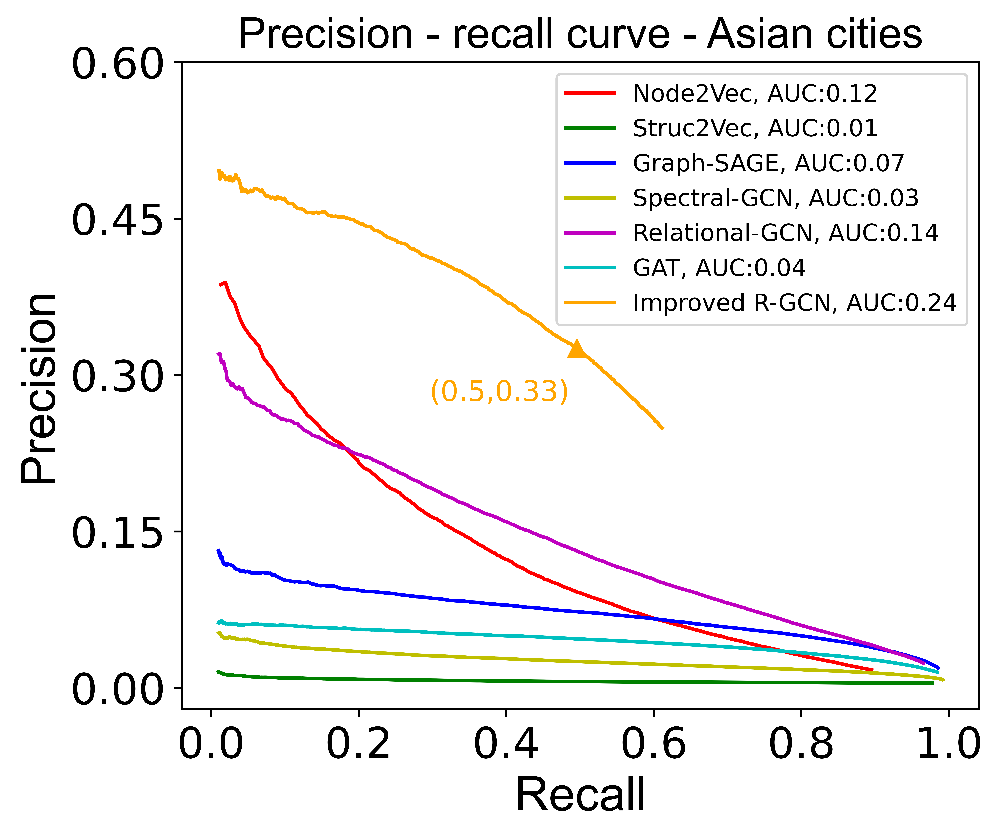

In [29]:
models = ['Node2Vec', 'Struc2Vec', 'Graph-SAGE', 'Spectral-GCN', 'Relational-GCN', 'GAT', 'Improved R-GCN']
colors = ['r', 'g', 'b', 'y', 'm', 'c', 'orange']
fig = plt.figure(figsize=(6,5),dpi=1200)
for i, model in enumerate(models):
    print(model)
    if i > 6:
        d = json.load(open('precision_recall_asia.json', 'r'))
        precision, recall, auc, best_p, best_r = d['precision'], d['recall'], d['auc'], d['best_p'], d['best_r']
        print(best_p, best_r)
    else:
        precision, recall, auc, best_p, best_r = precision_recall(model, data_dir, data_type = 'Asia', improved = (i == 6))
    plt.plot(recall, precision, color=colors[i], label=model + ', AUC:' + str(round(auc, 2)))
    if best_p is not None:
        plt.scatter(best_r, best_p, color=colors[i], marker='^', s = 50)
        plt.text(best_r-0.2, best_p-0.05, "({},{})".format(round(best_r, 2), round(best_p, 2)), color=colors[i], size=12)
plt.title("Precision - recall curve - Asian cities",font1, fontsize=18)
plt.xlabel('Recall',font1, fontsize=20)
plt.ylabel('Precision',font1, fontsize=20)
plt.xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0],fontsize=18)
plt.yticks([0, 0.15, 0.3, 0.45, 0.6],fontsize=18)
plt.legend(loc="upper right",fontsize=10)
plt.savefig('figure1_c_asia.pdf',bbox_inches = 'tight')
plt.savefig('figure1_c_asia.svg',bbox_inches = 'tight')
plt.show()

# Europe

Node2Vec
Struc2Vec
Graph-SAGE
Spectral-GCN
Relational-GCN
GAT


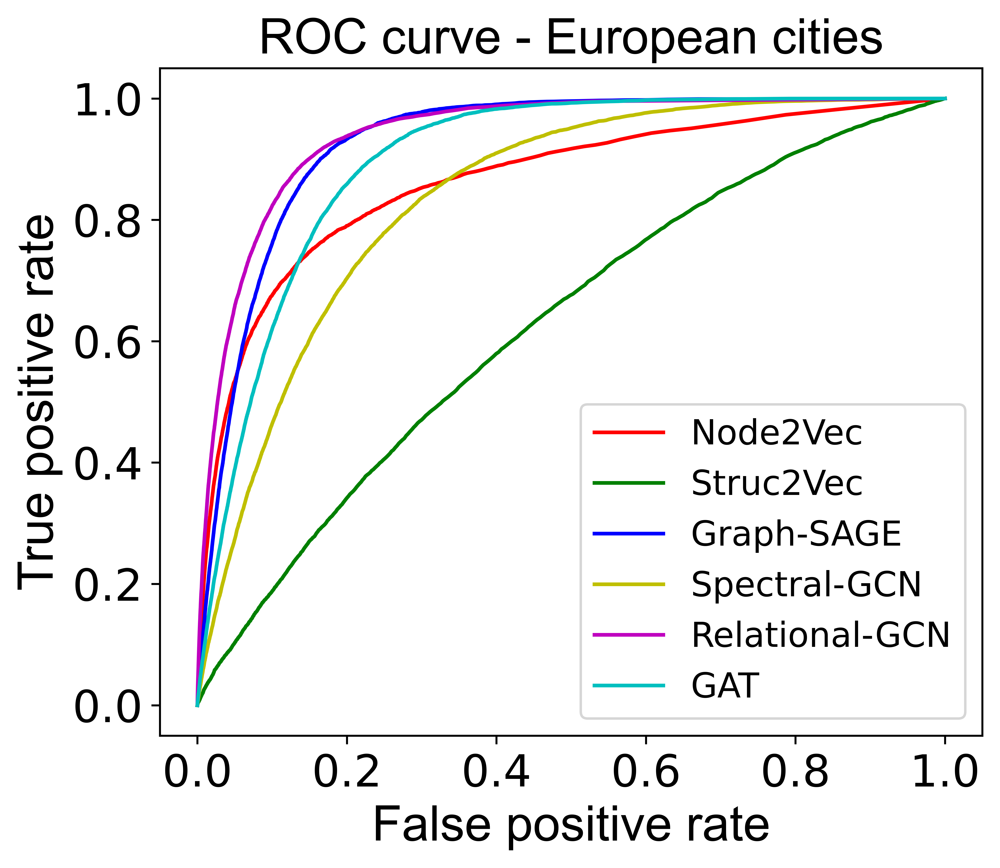

In [8]:
data_dir = 'D:/data/road-network-predictability/data_2020715/'
models = ['Node2Vec', 'Struc2Vec', 'Graph-SAGE', 'Spectral-GCN', 'Relational-GCN', 'GAT']
colors = ['r', 'g', 'b', 'y', 'm', 'c']
fig = plt.figure(figsize=(6,5),dpi=1200)
for i, model in enumerate(models):
    print(model)
    fpr, tpr = roc_curve(model, data_dir, data_type = 'Europe')
    plt.plot(fpr, tpr, color=colors[i], label=model)
plt.title("ROC curve - European cities",font1, fontsize=20)
plt.xlabel('False positive rate',font1, fontsize=20)
plt.ylabel('True positive rate',font1, fontsize=20)
plt.xticks([0,0.2, 0.4, 0.6, 0.8, 1.0],fontsize=18)
plt.yticks([0,0.2, 0.4, 0.6, 0.8, 1.0],fontsize=18)
plt.legend(loc="lower right",fontsize=14)
plt.savefig('figure1_b_europe.pdf',bbox_inches = 'tight')
plt.savefig('figure1_b_europe.svg',bbox_inches = 'tight')
plt.show()

Relational-GCN
0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200,210,220,230,240,250,260,270,280,290,300,310,320,330,340,350,360,370,380,390,400,410,420,430,440,450,460,470,480,490,500,510,520,530,540,550,560,570,580,590,600,610,620,630,640,650,660,670,680,690,700,710,720,730,740,750,760,770,780,790,800,810,820,830,840,850,860,870,880,890,900,910,920,930,940,950,


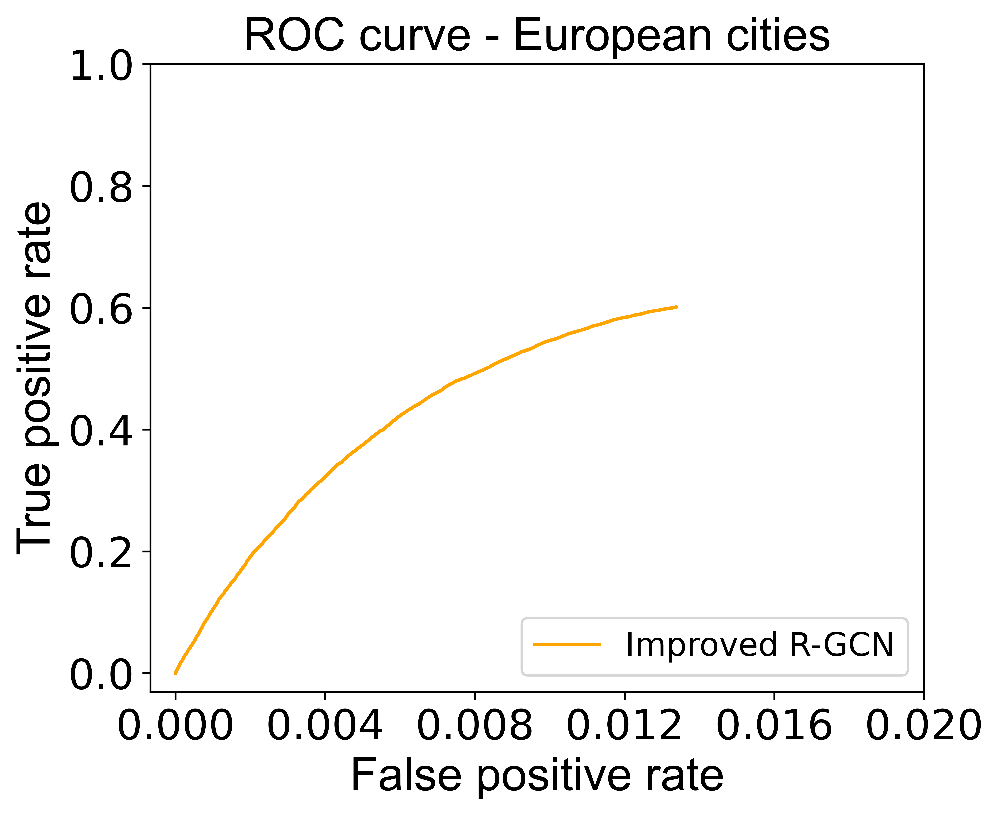

In [16]:
data_dir = 'D:/data/road-network-predictability/data_2020715/'
models = ['Relational-GCN']
colors = ['orange']
fig = plt.figure(figsize=(6,5),dpi=1200)
for i, model in enumerate(models):
    print(model)
    fpr, tpr = roc_curve(model, data_dir, data_type = 'Europe', improved = True)
    plt.plot(fpr, tpr, color=colors[i], label='Improved R-GCN')
plt.title("ROC curve - European cities",font1, fontsize=20)
plt.xlabel('False positive rate',font1, fontsize=20)
plt.ylabel('True positive rate',font1, fontsize=20)
plt.xticks([0,0.004,0.008,0.012,0.016,0.02],fontsize=18)
plt.yticks([0,0.2, 0.4, 0.6, 0.8, 1.0],fontsize=18)
plt.legend(loc="lower right",fontsize=14)
plt.savefig('figure1_b_improved_europe.pdf',bbox_inches = 'tight')
plt.savefig('figure1_b_improved_europe.svg',bbox_inches = 'tight')
plt.show()

Node2Vec
Struc2Vec
Graph-SAGE
Spectral-GCN
Relational-GCN
GAT
Improved R-GCN
0.34647833312026416 0.3544063807531381


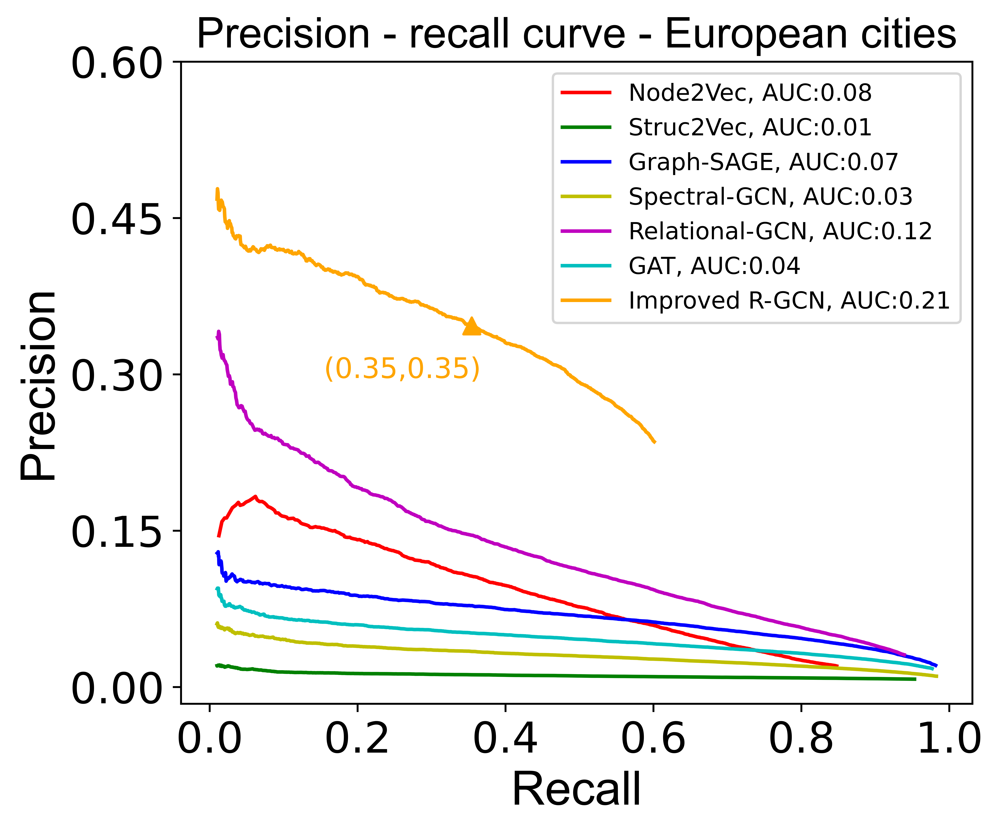

In [28]:
models = ['Node2Vec', 'Struc2Vec', 'Graph-SAGE', 'Spectral-GCN', 'Relational-GCN', 'GAT', 'Improved R-GCN']
colors = ['r', 'g', 'b', 'y', 'm', 'c', 'orange']
fig = plt.figure(figsize=(6,5),dpi=1200)
for i, model in enumerate(models):
    print(model)
    if i == 6:
        d = json.load(open('precision_recall_europe.json', 'r'))
        precision, recall, auc, best_p, best_r = d['precision'], d['recall'], d['auc'], d['best_p'], d['best_r']
        print(best_p, best_r)
    else:
        precision, recall, auc, best_p, best_r = precision_recall(model, data_dir, data_type = 'Europe', improved = (i == 6))
    plt.plot(recall, precision, color=colors[i], label=model + ', AUC:' + str(round(auc, 2)))
    if best_p is not None:
        plt.scatter(best_r, best_p, color=colors[i], marker='^', s = 50)
        plt.text(best_r-0.2, best_p-0.05, "({},{})".format(round(best_r, 2), round(best_p, 2)), color=colors[i], size=12)
plt.title("Precision - recall curve - European cities",font1, fontsize=18)
plt.xlabel('Recall',font1, fontsize=20)
plt.ylabel('Precision',font1, fontsize=20)
plt.xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0],fontsize=18)
plt.yticks([0, 0.15, 0.3, 0.45, 0.6],fontsize=18)
plt.legend(loc="upper right",fontsize=10)
plt.savefig('figure1_c_europe.pdf',bbox_inches = 'tight')
plt.savefig('figure1_c_europe.svg',bbox_inches = 'tight')
plt.show()

In [2]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

In [3]:
length = {-50: 982, -49: 1095, -48: 1244, -47: 1028, -46: 1244, -45: 1347, -44: 1268,
            -43: 1222, -42: 1671, -41: 1347, -40: 1776, -39: 1434, -38: 1750, -37: 1650,
            -36: 1888, -35: 1664, -34: 1991, -33: 1988, -32: 2079, -31: 2307, -30: 2452,
            -29: 2236, -28: 3074, -27: 2783, -26: 2964, -25: 3522, -24: 3932, -23: 3748,
            -22: 3984, -21: 4323, -20: 5027, -19: 4925, -18: 5656, -17: 6102, -16: 6781,
            -15: 8359, -14: 8411, -13: 8983, -12: 10151, -11: 11762, -10: 14136,
            -9: 15103, -8: 19982, -7: 25339, -6: 18708, -5: 36535, -4: 42604, -3: 43962,
            -2: 73692, -1: 49601, 0: 865149, 1: 59370, 2: 111646, 3: 52621, 4: 46172,
            5: 25665, 6: 29728, 7: 16065, 8: 20993, 9: 11955, 10: 14027, 11: 10019,
            12: 9985, 13: 7317, 14: 7654, 15: 7457, 16: 7034, 17: 5789, 18: 6095,
            19: 5066, 20: 5184, 21: 4863, 22: 3931, 23: 3673, 24: 3588, 25: 3234,
            26: 3348, 27: 2950, 28: 3243, 29: 2515, 30: 2713, 31: 2339, 32: 2606,
            33: 2163, 34: 2095, 35: 1734, 36: 2000, 37: 1527, 38: 1688, 39: 1473,
            40: 1457, 41: 1422, 42: 1386, 43: 1306, 44: 1082, 45: 1183, 46: 1092,
            47: 1053, 48: 1036, 49: 1023, 50: 983}
prob = {-50: -7.5516, -49: -7.4427, -48: -7.3151, -47: -7.5058, -46: -7.3151,
        -45: -7.2356, -44: -7.296, -43: -7.3329, -42: -7.02, -41: -7.2356,
        -40: -6.9591, -39: -7.173, -38: -6.9738, -37: -7.0327, -36: -6.8979,
        -35: -7.0242, -34: -6.8448, -33: -6.8463, -32: -6.8015, -31: -6.6975,
        -30: -6.6365, -29: -6.7287, -28: -6.4105, -27: -6.5099, -26: -6.4469,
        -25: -6.2744, -24: -6.1643, -23: -6.2122, -22: -6.1511, -21: -6.0695,
        -20: -5.9186, -19: -5.9391, -18: -5.8007, -17: -5.7248, -16: -5.6193,
        -15: -5.4101, -14: -5.4039, -13: -5.3381, -12: -5.2159, -11: -5.0686,
        -10: -4.8847, -9: -4.8185, -8: -4.5386, -7: -4.3011, -6: -4.6045,
        -5: -3.9352, -4: -3.7815, -3: -3.7501, -2: -3.2335, -1: -3.6294, 0: -0.7705,
        1: -3.4496, 2: -2.8181, 3: -3.5703, 4: -3.7011, 5: -4.2883, 6: -4.1413,
        7: -4.7568, 8: -4.4892, 9: -5.0523, 10: -4.8924, 11: -5.2289, 12: -5.2323,
        13: -5.5432, 14: -5.4982, 15: -5.5243, 16: -5.5827, 17: -5.7775, 18: -5.726,
        19: -5.9109, 20: -5.8879, 21: -5.9518, 22: -6.1645, 23: -6.2324, 24: -6.2558,
        25: -6.3597, 26: -6.3251, 27: -6.4516, 28: -6.3569, 29: -6.6112, 30: -6.5354,
        31: -6.6837, 32: -6.5756, 33: -6.7619, 34: -6.7939, 35: -6.983, 36: -6.8403,
        37: -7.1101, 38: -7.0099, 39: -7.1461, 40: -7.1571, 41: -7.1814, 42: -7.207,
        43: -7.2665, 44: -7.4546, 45: -7.3654, 46: -7.4454, 47: -7.4818,
        48: -7.4981, 49: -7.5107, 50: -7.5506}

In [5]:
font2 = {'family' : 'Arial',
'weight' : 'normal',
'size'   : 22,
}
tmp = []
for k, v in length.items():
    tmp += [k] * v
fig = plt.figure(figsize=(8, 6), dpi=1200)
sns.distplot(np.array(tmp))
plt.xticks([-40, 20, 0, 20, 40], fontsize=18)
plt.yticks([0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35], fontsize=18)
plt.xlabel('Buggy lines length - correct fixes length', font2, fontsize=22)
plt.ylabel('Frequency', font2, fontsize=22)
plt.savefig('D:/materials-Purdue/Lab/figures/length.pdf',bbox_inches = 'tight')
plt.show()

In [11]:
fig = plt.figure(figsize=(8, 6), dpi=1200)
plt.plot(list(prob.keys()), list(prob.values()))
plt.xticks([-40, 20, 0, 20, 40], fontsize=16)
plt.yticks([-7, -6, -5, -4, -3, -2, -1, 0], fontsize=16)
plt.xlabel('Buggy lines length - correct fixes length', fontsize=18)
plt.ylabel('Log-probability', fontsize=18)
plt.savefig('D:/materials-Purdue/Lab/figures/length_log.pdf',bbox_inches = 'tight')
plt.show()